# Audio Transcription

## Audio Track of Interview - 2 Speakers

In [1]:
import librosa

In [2]:
# Interview to Carl Sagan
audio_path = 'interview.mp3'
y, sr = librosa.load(audio_path, sr=None)

In [3]:
from IPython.display import Audio

# Play the loaded audio
Audio(data=y, rate=sr)

## Pyannote Audio Transcription

In [4]:
!pip install pyannote.audio

This is a gated model! You must request access that is linked to your HF token at both these links:
* https://huggingface.co/pyannote/speaker-diarization-3.1
* https://huggingface.co/pyannote/segmentation-3.0

### Hugging Face Logging

In [9]:
!pip install python-dotenv

In [15]:
import os
from dotenv import load_dotenv
load_dotenv()

True

In [13]:
hf_token = os.getenv("HUGGING_FACE_TOKEN")

In [16]:
# We need to accept the conditions of two gated models on the web UI
# and then log in from the notebook
# https://huggingface.co/pyannote/speaker-diarization-3.1
# https://huggingface.co/pyannote/segmentation-3.0
# Additionally, pyannote.audio needs to be installed
from huggingface_hub import notebook_login
notebook_login()

## Processing

If you have fully setup CUDA with your NVIDIA card, you may want to consider trying to use your GPU. Note: We do not support installation or setup support in this course for CUDA due to the difficuly in trying to help someone install this without access to their computer.

```python
import torch
pipeline.to(torch.device("cuda"))
```

## Pipeline

In [17]:
from pyannote.audio import Pipeline

# We need to accept the conditions of two gated models on the web UI
# and then log in from the notebook
# https://huggingface.co/pyannote/speaker-diarization-3.1
# https://huggingface.co/pyannote/segmentation-3.0
# Additionally, pyannote.audio needs to be installed
diarization_pipeline = Pipeline.from_pretrained(
    "pyannote/speaker-diarization-3.1", # even though that's pyannote.audio, we pass the HF model string
    use_auth_token=True # use notebook_login() beforehand
)

config.yaml:   0%|          | 0.00/469 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/5.91M [00:00<?, ?B/s]

config.yaml:   0%|          | 0.00/399 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/26.6M [00:00<?, ?B/s]

config.yaml:   0%|          | 0.00/221 [00:00<?, ?B/s]

In [18]:
# Run diarization
# This will take a very long time on less powerful computers!
# On Google Colab T4: 271 sec (for 87 sec of audio: approx 3x the duration)
# The hook repots the progress
from pyannote.audio.pipelines.utils.hook import ProgressHook
with ProgressHook() as hook:
    diarization = diarization_pipeline("interview.mp3", hook=hook)

Output()

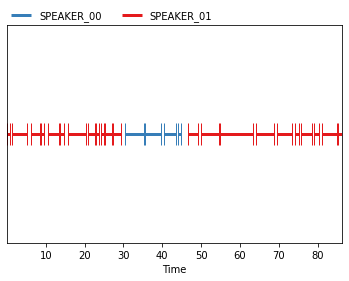

In [ ]:
# Plot diarization
diarization

In [ ]:
diarization.chart()

[('SPEAKER_01', 57.7125), ('SPEAKER_00', 12.976875000000003)]

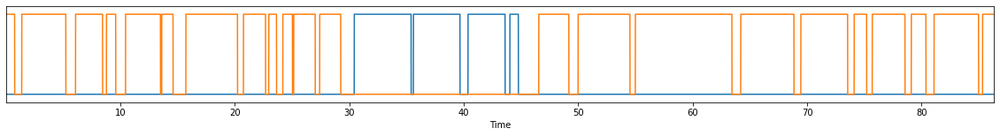

In [ ]:
diarization.discretize()

In [ ]:
# Print the result, formated
# We can see we have many small segments with a label speaker associated to them
# But in reality, many small segments with the same speaker occur successively
# Thus, when we perform the transcription, we wan to join all of them
for turn, _, speaker in diarization.itertracks(yield_label=True):
    print(f"start={turn.start:.1f}s stop={turn.end:.1f}s speaker_{speaker}")
    # start=0.0s stop=0.8s speaker_SPEAKER_01
    # start=1.4s stop=5.2s speaker_SPEAKER_01
    # ...

start=0.0s stop=0.8s speaker_SPEAKER_01
start=1.4s stop=5.2s speaker_SPEAKER_01
start=6.1s stop=8.4s speaker_SPEAKER_01
start=8.8s stop=9.6s speaker_SPEAKER_01
start=10.5s stop=13.5s speaker_SPEAKER_01
start=13.6s stop=14.6s speaker_SPEAKER_01
start=15.7s stop=20.2s speaker_SPEAKER_01
start=20.8s stop=22.7s speaker_SPEAKER_01
start=23.0s stop=23.6s speaker_SPEAKER_01
start=24.2s stop=25.0s speaker_SPEAKER_01
start=25.1s stop=27.0s speaker_SPEAKER_01
start=27.4s stop=29.2s speaker_SPEAKER_01
start=30.4s stop=35.4s speaker_SPEAKER_00
start=35.6s stop=39.7s speaker_SPEAKER_00
start=40.4s stop=43.6s speaker_SPEAKER_00
start=44.0s stop=44.8s speaker_SPEAKER_00
start=46.6s stop=49.2s speaker_SPEAKER_01
start=50.0s stop=54.5s speaker_SPEAKER_01
start=55.0s stop=63.4s speaker_SPEAKER_01
start=64.2s stop=68.8s speaker_SPEAKER_01
start=69.5s stop=73.5s speaker_SPEAKER_01
start=74.1s stop=75.2s speaker_SPEAKER_01
start=75.7s stop=78.6s speaker_SPEAKER_01
start=79.1s stop=80.4s speaker_SPEAKER_01


### Function to combine total start and stop speaking times

In [19]:
def consolidate_speaker_segments(diarization):
    consolidated_segments = []
    current_speaker = None
    segment_start = None

    # We have many small segments with a label speaker associated to them
    # But in reality, many small segments with the same speaker occur successively
    # Thus, when we perform the transcription, we wan to join all of them
    # These larger chunks are the consolidated_segments
    for turn, _, speaker in diarization.itertracks(yield_label=True):
        if speaker != current_speaker:
            if current_speaker is not None:
                consolidated_segments.append((current_speaker, segment_start, turn.start))
            current_speaker = speaker
            segment_start = turn.start
        segment_end = turn.end

    if current_speaker is not None:
        consolidated_segments.append((current_speaker, segment_start, segment_end))

    return consolidated_segments

In [20]:
# Example usage with the provided diarization object:
segments = consolidate_speaker_segments(diarization)

In [22]:
# Now, all small successive segments that belong to the same speaker
# are consolidated
segments
# [('SPEAKER_01', 0.03096875, 30.43971875),
#  ('SPEAKER_00', 30.43971875, 46.555343750000006),
#  ('SPEAKER_01', 46.555343750000006, 86.31284375)]

[('SPEAKER_01', 0.03096875, 30.43971875),
 ('SPEAKER_00', 30.43971875, 46.555343750000006),
 ('SPEAKER_01', 46.555343750000006, 86.31284375)]

In [23]:
for speaker, start, end in segments:
    print(f"speaker_{speaker} start={start:.1f}s stop={end:.1f}s")

speaker_SPEAKER_01 start=0.0s stop=30.4s
speaker_SPEAKER_00 start=30.4s stop=46.6s
speaker_SPEAKER_01 start=46.6s stop=86.3s


In [24]:
!pip install pydub

In [25]:
from pydub import AudioSegment
import os

# We split the audio file into large speaker segments
def split_audio_segments(
        audio_file, # The audio file
        segments,  # List with large segment tupples (speaker, start, end)
        output_dir='segmented_audio' # Output of the large audio segments
    ):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Load the audio file
    audio = AudioSegment.from_file(audio_file)

    # Iterate over the segments and export each one
    for idx, (speaker, start, end) in enumerate(segments):
        # Calculate start and end in milliseconds
        start_ms = start * 1000
        end_ms = end * 1000

        # Extract the segment: PyDub allows to use slicing!
        segment = audio[start_ms:end_ms]

        # Create the output file name
        speaker_label = speaker.split('_')[-1]  # Get speaker identifier
        output_file = os.path.join(output_dir, f"{idx:02d}_SPEAKER{speaker_label}_START{start:.0f}_STOP{end:.0f}.mp3")

        # Export the segment
        segment.export(output_file, format="mp3")
        print(f"Exported {output_file}")

In [26]:
split_audio_segments('interview.mp3',segments)
# Now, we have 3 sperate MP3s
# Exported segmented_audio/00_SPEAKER01_START0_STOP30.mp3
# Exported segmented_audio/01_SPEAKER00_START30_STOP47.mp3
# Exported segmented_audio/02_SPEAKER01_START47_STOP86.mp3

Exported segmented_audio/00_SPEAKER01_START0_STOP30.mp3
Exported segmented_audio/01_SPEAKER00_START30_STOP47.mp3
Exported segmented_audio/02_SPEAKER01_START47_STOP86.mp3


# Speech Transcription

In [27]:
# Use a pipeline as a high-level helper
from transformers import pipeline

# Transcription model; default model:
# https://huggingface.co/facebook/wav2vec2-base-960h
# Note that the model works also with the raw unsegmented model
# but we don't know who's talking!
pipe = pipeline("automatic-speech-recognition")

No model was supplied, defaulted to facebook/wav2vec2-base-960h and revision 55bb623 (https://huggingface.co/facebook/wav2vec2-base-960h).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

In [28]:
import os
import re

def process_segmented_files(directory='segmented_audio'):
    # Ensure the directory exists
    if not os.path.exists(directory):
        raise FileNotFoundError(f"Directory '{directory}' does not exist.")

    # List all files in the directory
    files = os.listdir(directory)

    # Process each file
    # We use the filename to derive the speaker from it
    for file in files:
        file_path = os.path.join(directory, file)
        if os.path.isfile(file_path):
            text = pipe(file_path)['text']
            num,speaker,time_start,time_stop = file.split('_')
            time_stop = time_stop.replace(".mp3",'')
            print(f"{speaker}-- {time_start}sec {time_stop}sec:\n{text}")
            print('\n\n')

In [29]:
# Transcription of all 3 audio segments
# takes 22 secs on a Google Colab T4: 87/22 -> approx. 4
# Clearly, diarization seems to be the bottleneck
process_segmented_files()
# SPEAKER00-- START30sec STOP47sec:
# YOU MAKE THE ARGUMENT...
# SPEAKER01-- START0sec STOP30sec:
# MOST OF US WOULD BE SURPRISED TO HEAR THAT...
# SPEAKER01-- START47sec STOP86sec:
# WELL FIRST OFF AS YOU SUGGEST...

SPEAKER00-- START30sec STOP47sec:
YOU MAKE THE ARGUMENT IN PALE BLUE DOT THAT IT'S TIME TO HIT THE ROAD AGAIN SKYWARD AS IN SPACE TRAVEL EXPLORATION PERHAPS COLONIES FOR THE VERY SALVATION OF THE SPECIES HOW IS THAT



SPEAKER01-- START0sec STOP30sec:
MOST OF US WOULD BE SURPRISED TO HEAR THAT THE UNIVERSE IS GOING TO END ONE DAY WE EXPECT THE UNIVERSE TO GO ON FOREVER INTO THE FUTURE WHY DO WE HAVE THE IDEA THAT IT DOESN'T GO ON FOREVER INTO THE PAST I'M NOT SAYING I KNOW THE ANSWER TO THIS THIS IS ONE OF THE DEEPEST QUESTIONS AND WE DO NOT KNOW THE ANSWER WE SIMPLY HAVE TO KEEP AN OPEN MIND ALL OF US PHILOSOPHERS SCIENCES RELIGIOUS PEOPLE NO ONE IN FACT KNOWS



SPEAKER01-- START47sec STOP86sec:
WELL FIRST OFF AS YOU SUGGEST WE A WE ARE A WANDERING SPECIES WE COME FROM HUNTER GATHERERS WE ORE GNOMADS AND FOR THE MILLION YEARS THAT THE HUMAN FAMILY HAS BEEN AROUND THAT WAS OUR LIFE STYLE THAT MUST BE BUILT INTO US DEEPLY IT'S ONLY THE LAST TEN THOUSAND YEARS THAT WE'VE HAD A SETTLED A